# Lab Report for lab 6

* Please note that this lab report has two parts: **lab exercise** (10 marks) and **additional questions** (10 marks). <mark>Maximum marks for this lab report is 20.</mark><br>
* Please save your work repeatedly by pressing Ctrl+S.
* Go through shared notes and video for this lab session for clarification about lab exercise.


Note: The folder structure for this lab report look like:

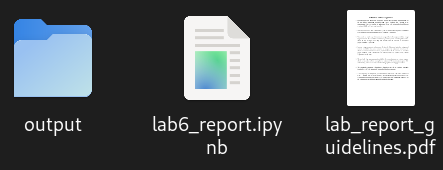

**Do not change/modify any folder except 'output' folder. Do not change/modify any file except this jupyter notebook file. Do not copy this jupyter notebook file to output folder.**

Objectives set for this lab report: 

- Develop an understanding of catchment and related terms
- Get familiar with concept of flow direction, flow accumulation and other related concepts
- Learn different steps (and their signification) in watershed delineation workflow.

## <font color='RebeccaPurple'>Part 1: Working with topographical data</font>

<font color='RebeccaPurple'>**Lab Exercise 1**: Download 30s spatial resolution DEM for Asia from hydroshed website (https://www.hydrosheds.org/hydrosheds-core-downloads) and delineate the Ganga basin up to NH27 bridge in Kanpur ($80.40960^o E$, $26.43597^o N$). Layout a map for the basin showing river network, DEM and contour lines inside the basin and Outlet point. Map should have all other required element (North Direction indicator, scale, and other elements). Save the map as `ganga_basin.png` file in `output` folder.</font>
    
<font color='RebeccaPurple'>(Hint: To reduce the computational complexity, you can subset the downloaded raster with a mask having approximate extent of North India/Ganga River Basin. Hence, you need to make a polygon vector layer first which encloses Ganga Basin and then clip raster with the vector layer.)</font>
    
<font color='RebeccaPurple'>Following is a sample map (not of Ganga Basin) for your reference. Please provide proper grid and title in your map.</font>
    
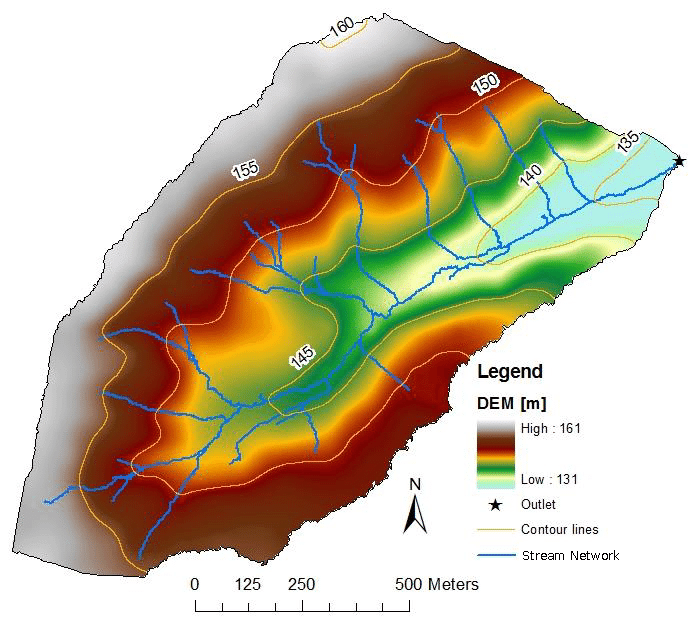
    
<font color='RebeccaPurple'>Complete the following sections (such as Abstract, Introduction, Details of data used, Method, Results and Discussions, and References(if any; optional)). </font> <mark>(<font color=red>Maximum Marks: 10</font>)</mark>

### <font color='RebeccaPurple'>1.1 Abstract</font>

We conducted this lab to Get familiar with concept of flow direction, flow accumulation and other related concepts  Learn different steps (and their signification) in watershed delineation workflow. We'll conduct a hydrological analysis. We will extract a channel network and delineate watersheds from a DEM as a starting point.Delineation is part of the process known as watershed segmentation, i.e., dividing the watershed into discrete land and channel
segments to analyze watershed behavior. There are problems which faced on DEM First is Void Filling and Second is Sink Filling.

The delineation of watersheds and stream networks is one of the most fundamental steps on water resources analysis. Working with QGIS for water resources shows some challenges on the normal water resources workflow since we have to couple raster / vector datasets, coordinate system, and algorithm limitations. 

We frequently download datasets that are larger than what they require. The map will appear cluttered and processing time will be slowed as a result. To increase processing, we subset and clip the raster by Using a polygon vector layer, we cut the raster into the required areas of raster. The processing will increase as a result. In QGIS, the clip raster by mask layer method is used to subset rasters.

### <font color='RebeccaPurple'>1.2 Introduction</font>

Watershed delineation is a surface hydrology related study. Any surface hydrological study deal with flow of water over the study region and hence it is sensitive to depressions on ground. In this lab, some key terms include: 
* A stream is a body of moving water. The size of a stream depends on how much water it is carrying; it could be small (like a creek or rivulet) or large (such as river).
* A tributary stream is one that supplies water to a main or larger stream. As an illustration, Yamuna is a tributary of the Ganges.
* Distributary: An outlet stream for the main stream. Distributary is typically found close to the Ocean Coast. Before emptying into the ocean, the main river close to the coast was split up into numerous distributary streams.
* A geographical area that drains into a stream is called a catchment or drainage basin. Consequently, the runoff (water) from a rainfall event on the catchment

Watershed delineation is a multi-step process.

Before starting any hydrological study on DEM, the DEM should be **Void-Filled and Sink Filled**.  

1. Filling :
   **Void-Filling**: For a variety of reasons (such as the sensor/algorithms used for generating the DEM might not work well with regions having snow, or the region was in the shadow zone of a mountain or other earth feature, etc.), elevation measurements may not be present at some locations in a typical DEM. By interpolating with the elevation values from other nearby locations, void-filling (or filling) aims to fill these locations' elevation values.
   **Sink Filling**: A sink is a cell that has no clear drainage direction, meaning that none of the cells around it are lower. These sinks in DEM could be the result of flawed DEM methodology.
   
2. Flow Direction calculation: The direction that water will flow from a raster pixel or cell is called the flow direction. We can create a stream network or stream link by connecting different cells flow directions in accordance with their directions. You can determine the direction of the flow using either the **D8 algorithm or the D-Infinity algorithm**.

3. Stream Extraction: 
   **Flow Accumulation**: Flow Accumulation is the total accumulated flow volume along the direction. The pixels with **high flow accumulation values (over a threshold value)** should be included in the stream. Finding the flow accumulation threshold above which the pixel becomes part of the stream is, however, arbitrary (as this threshold depend upon multiple geographical and climatological factors in the study region). Selecting very small threshold value will lead to dense stream network.

4. Marking the Basin Outlet/pour point: By creating a point vector layer, Basin Outlet can be marked. The coordinates or location of the basin outlet are typically known or provided. To learn how to create a point vector layer when the coordinates for the point are known, consult the lab manual for the previous lab session. The basin's outlet ought to be located above the stream's line of travel. If this is not the case, use the appropriate GIS option to snap the pour point to the stream vector layer and then determine its coordinates

5. Watershed delineation up to the pour point: Since the stream links and flow direction have already been determined. All the cells or pixels that drain into the stream and link up to the pour point can be calculated with the help of additional information about a properly snapped pour point. The pour point/basin outlet cell is shown in red in the following image, and the watershed for the pour point/basin outlet is shown in blue. 

 

### <font color='RebeccaPurple'>1.3 Details of Data Used</font>

1. DEM of asia is used of 30s resolution
2. Use of Outlet point coordinate ($80.40960^o E$, $26.43597^o N$).
3. Use of LAB 5 concept to form contour lines

### <font color='RebeccaPurple'>1.4 Method</font>

Downloading ASIA DEM 

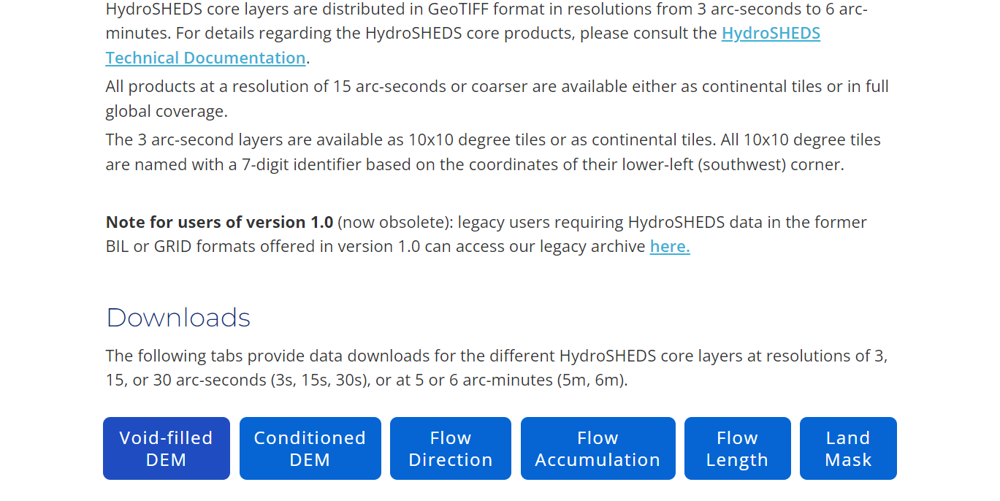

with 30s resolution

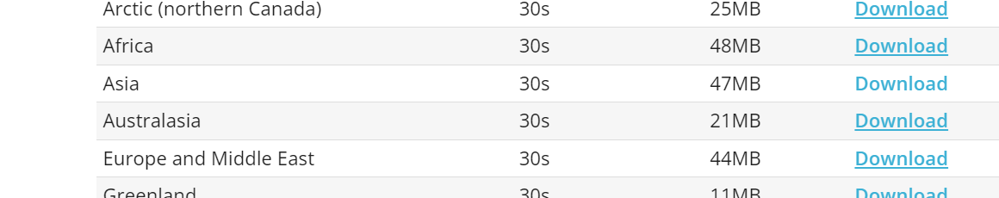

1. Importing the DEM of ASIA 

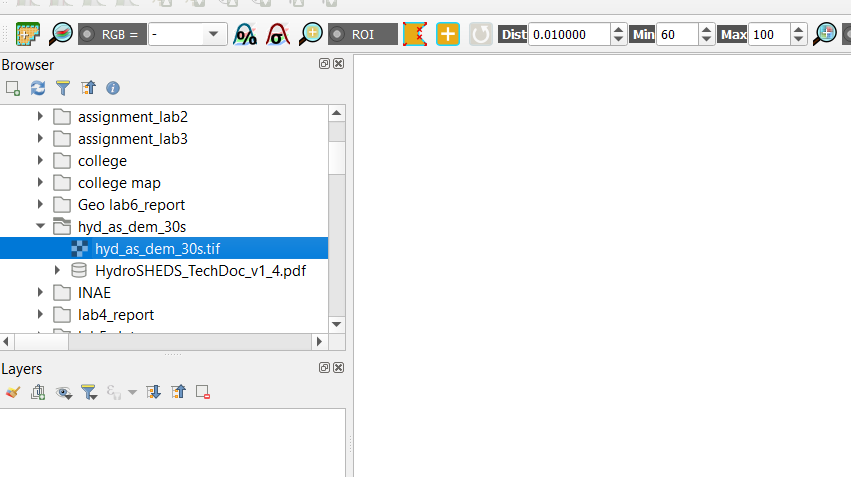

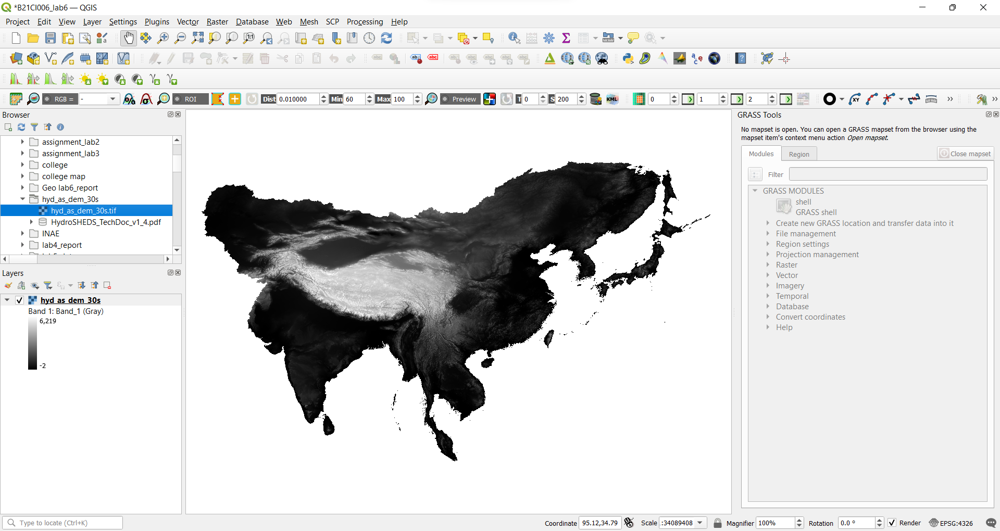

2. Creating new GEO package layer for of Ganga basin in polygon Geometry

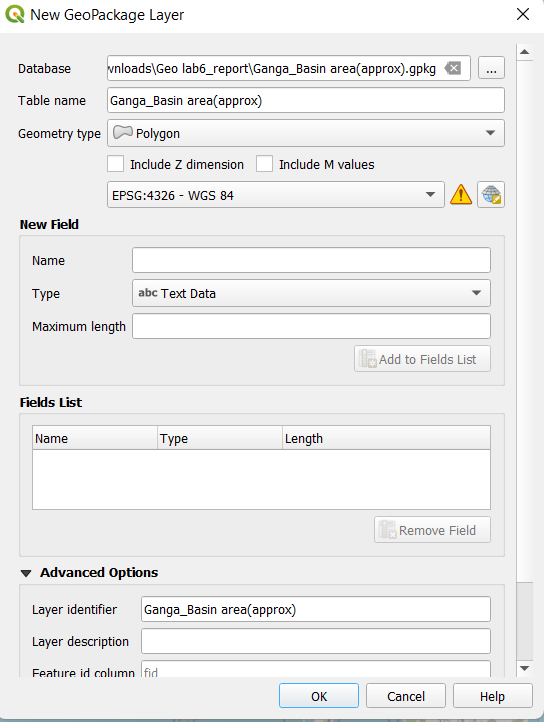

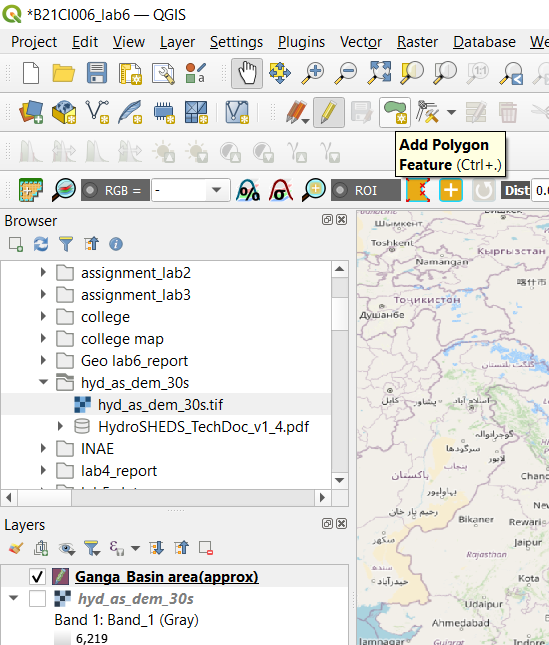

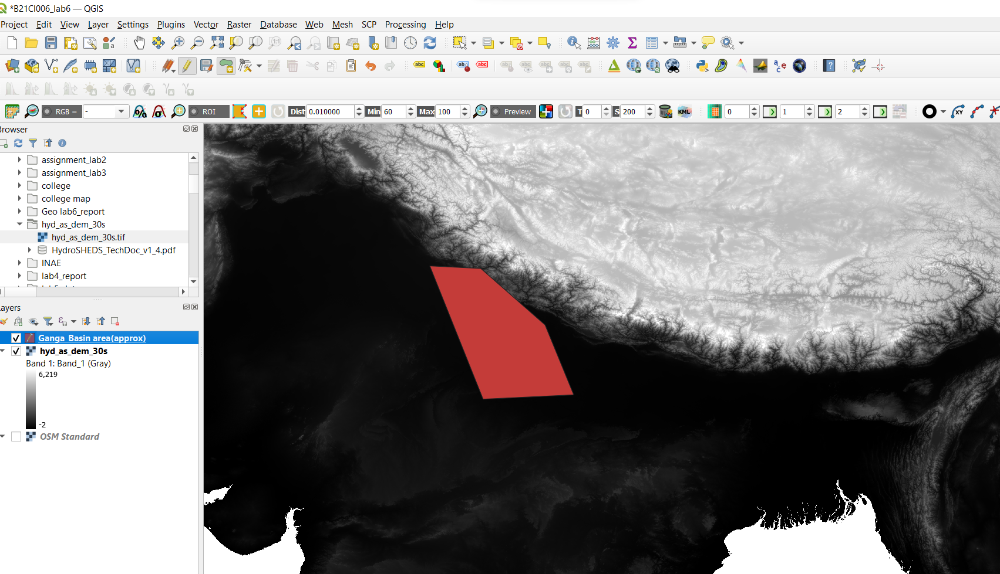

3. save toggle editing and apply Subsetting/Clip Raster: By using clip raster by mask layer

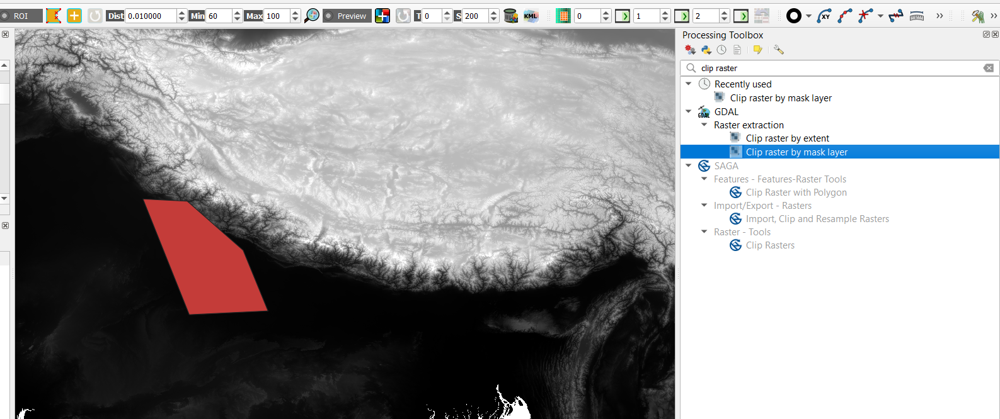

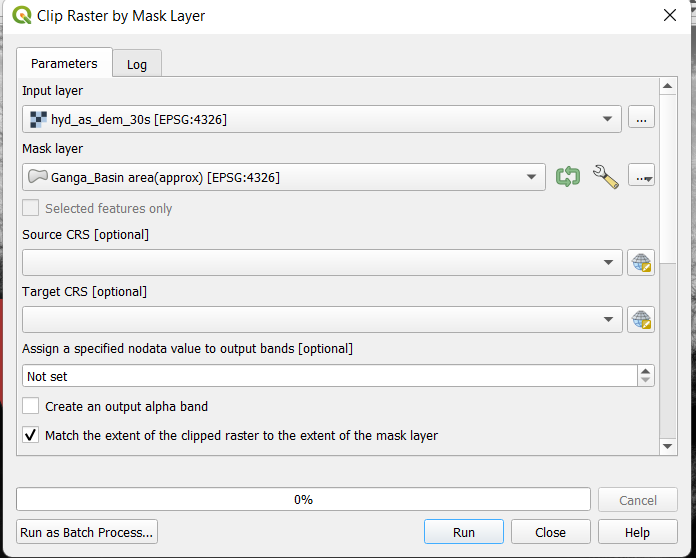

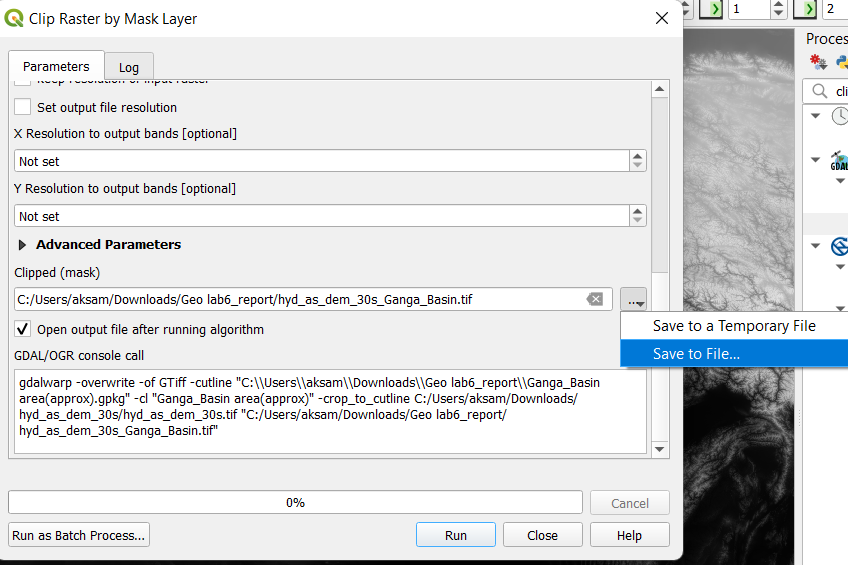

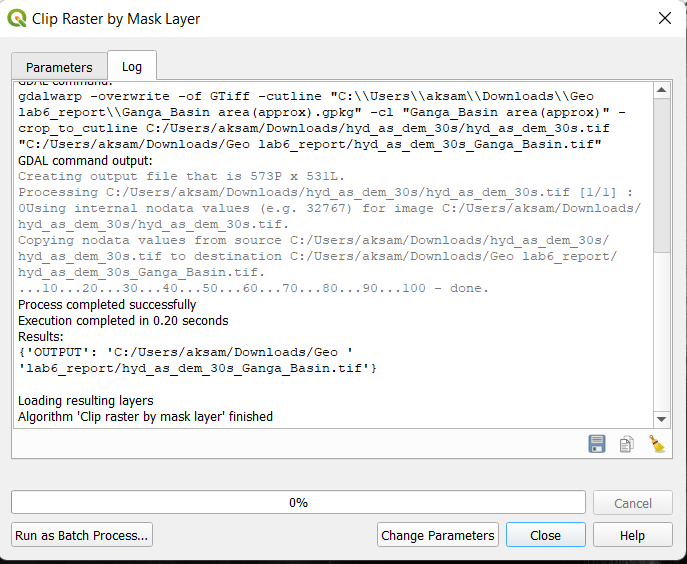

4. Remove not needed Layer

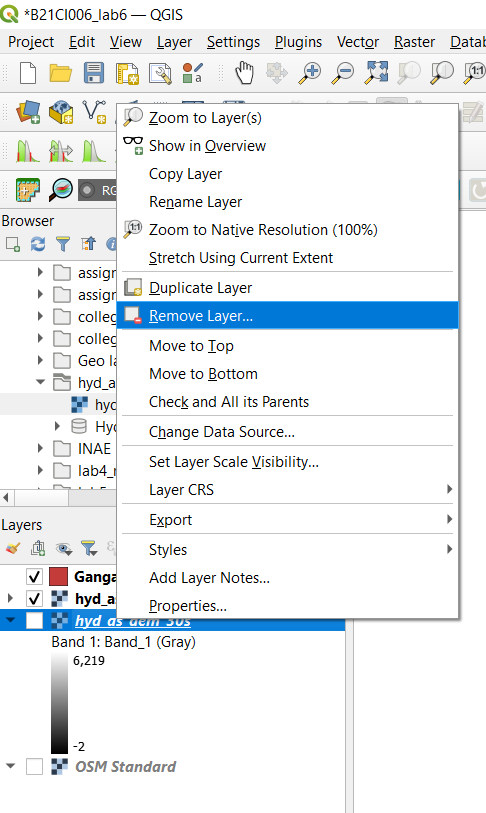

5. Use of fill nodata : to fill the empty space like empty space due to shadow

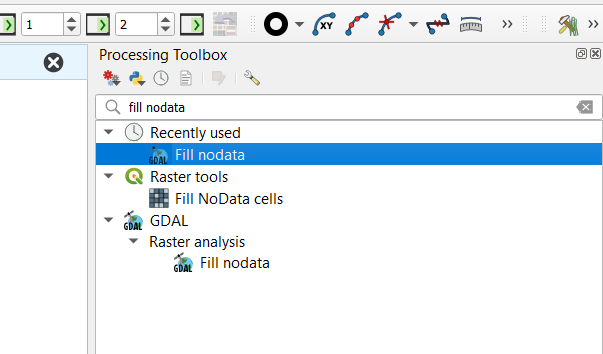

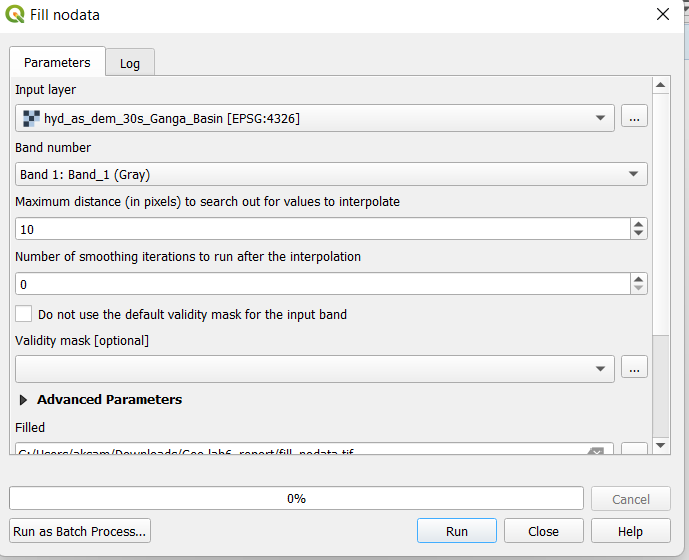

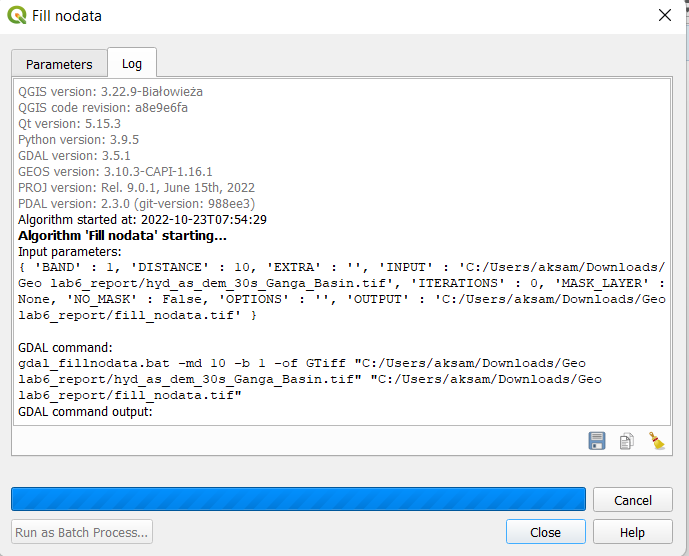

6. use of fill.dir

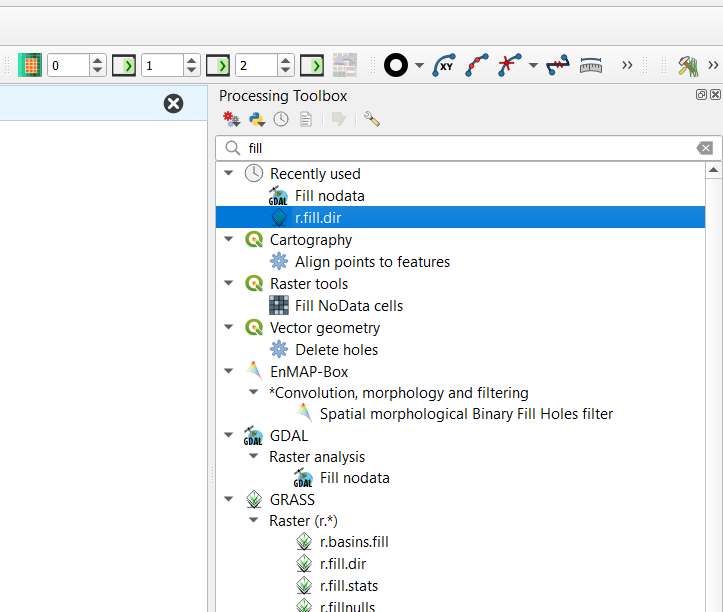

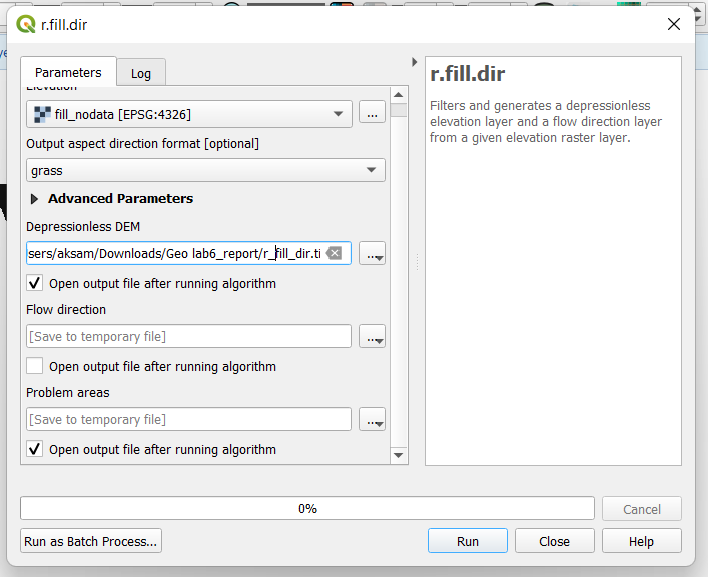

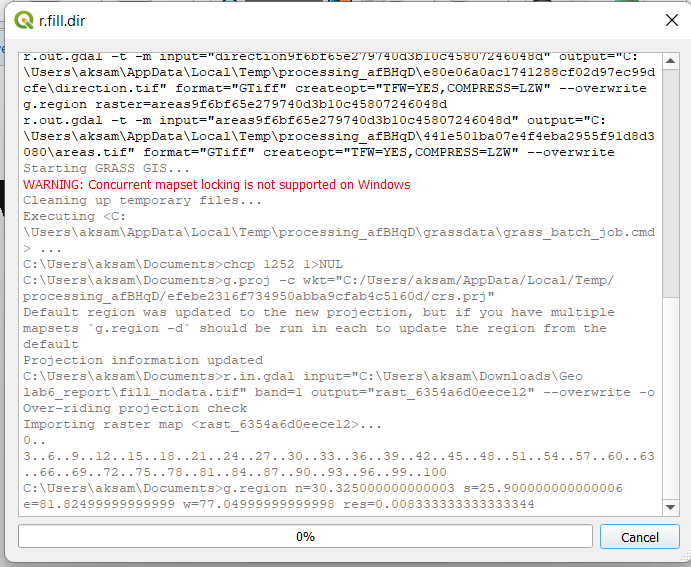

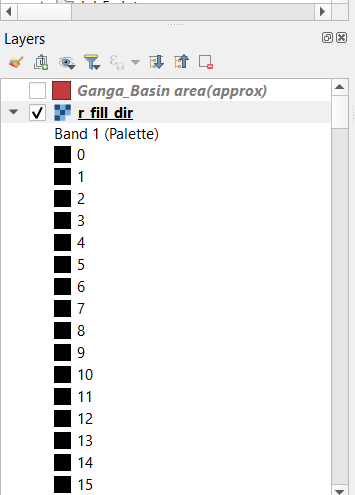

7. Use of r.watershed: to saw the flow of water from which flow direction and f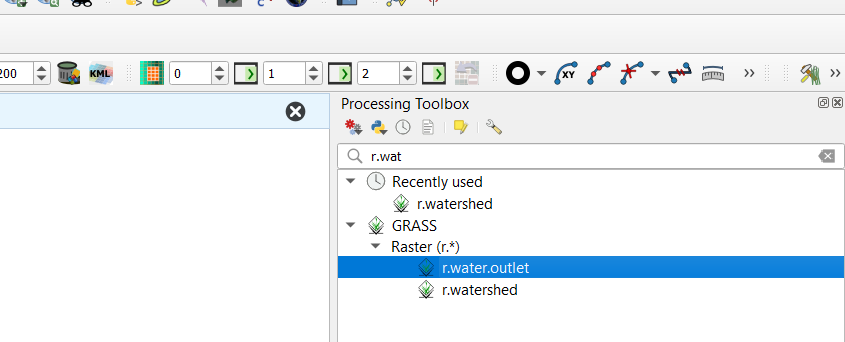low accumulation is created

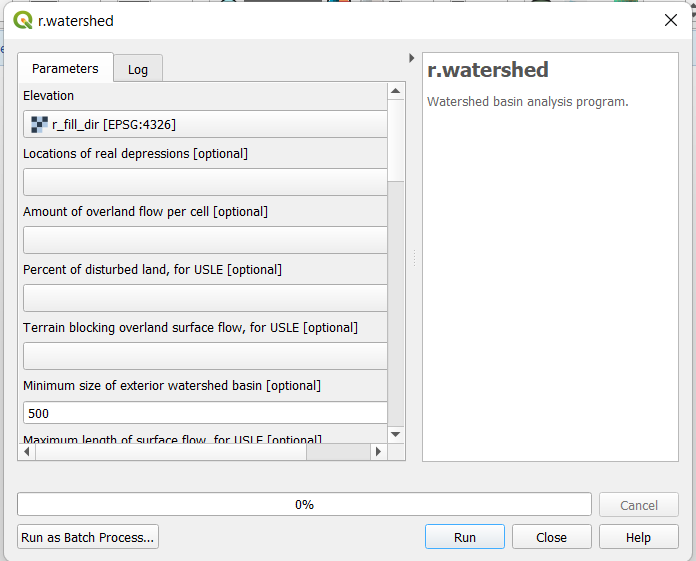

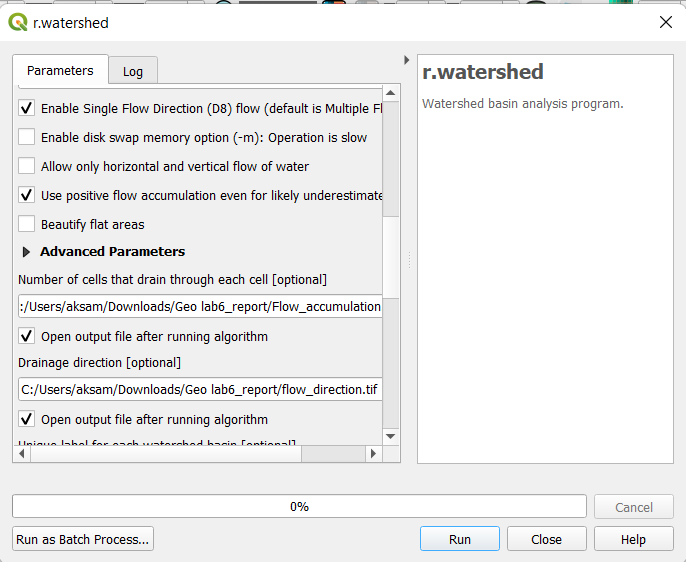

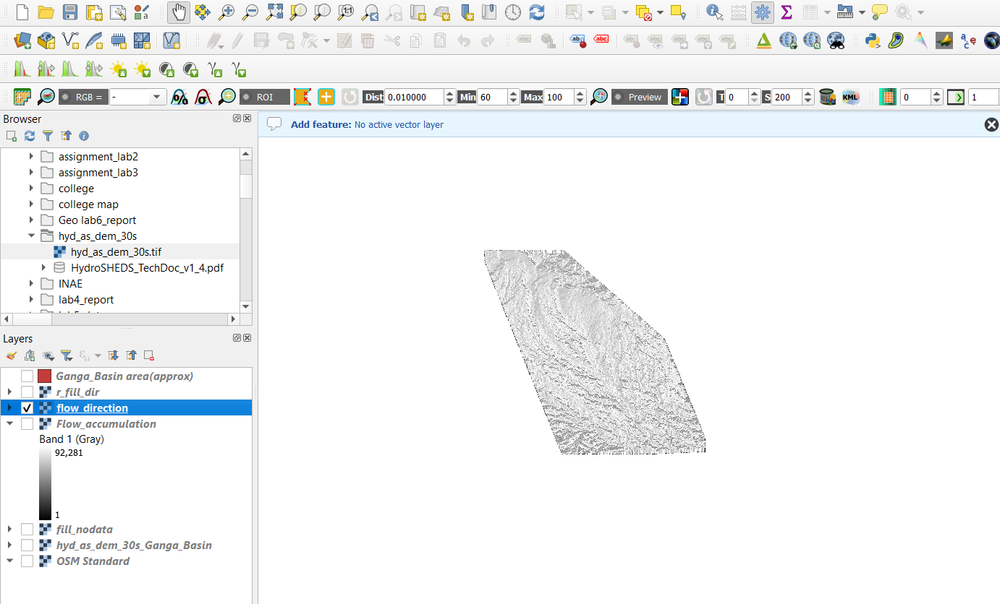

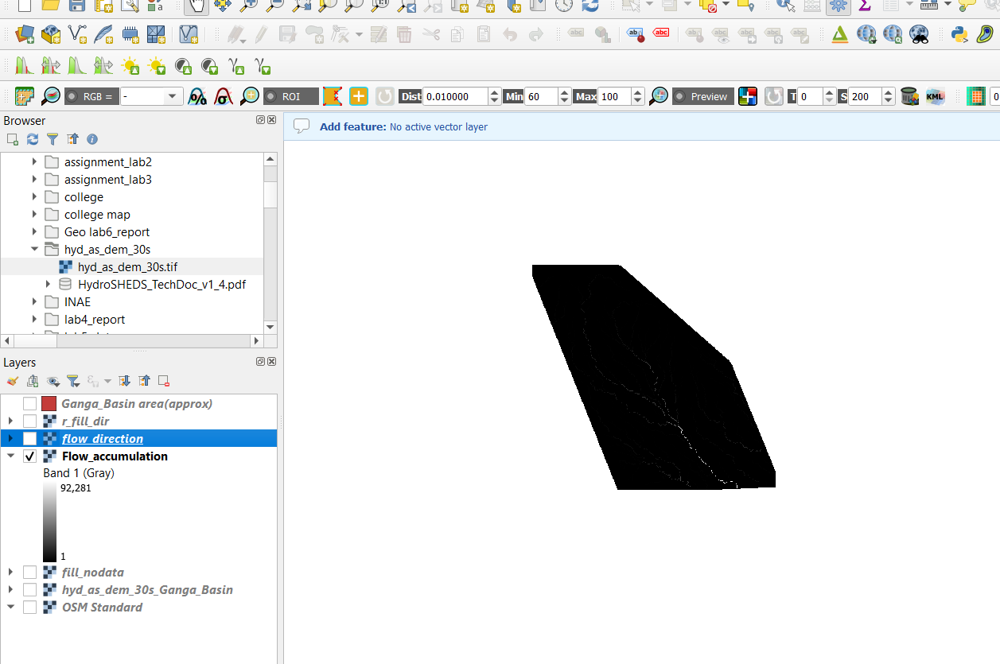

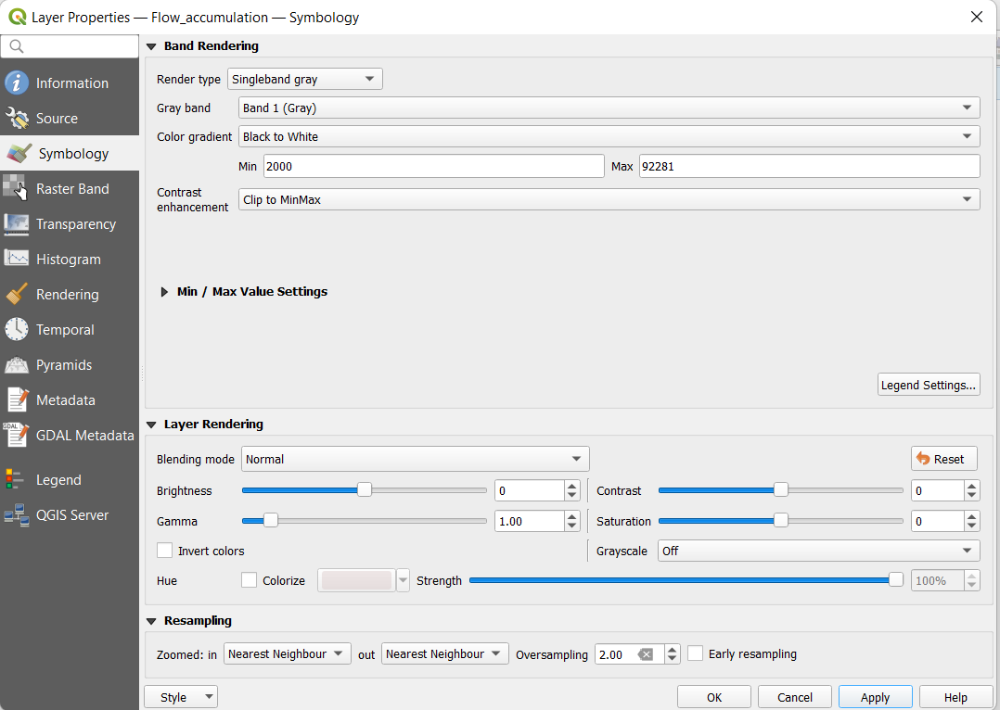

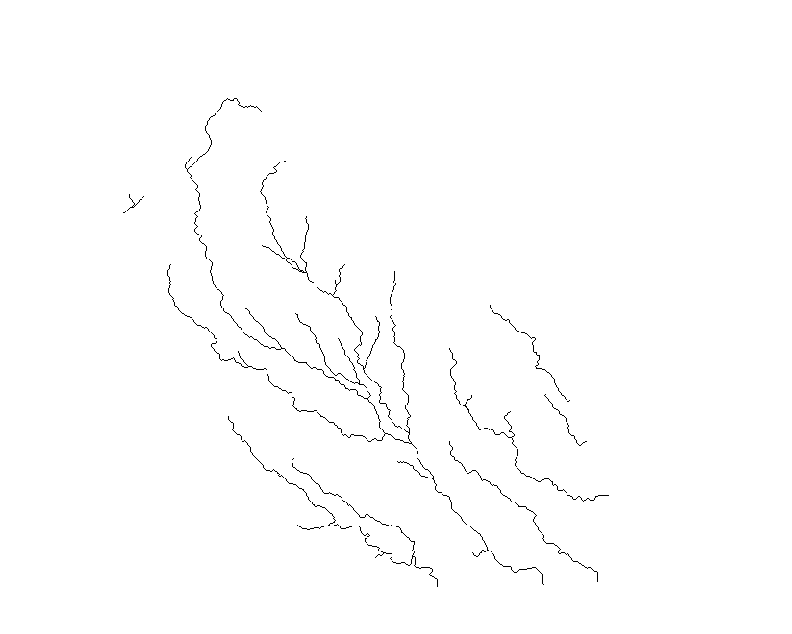

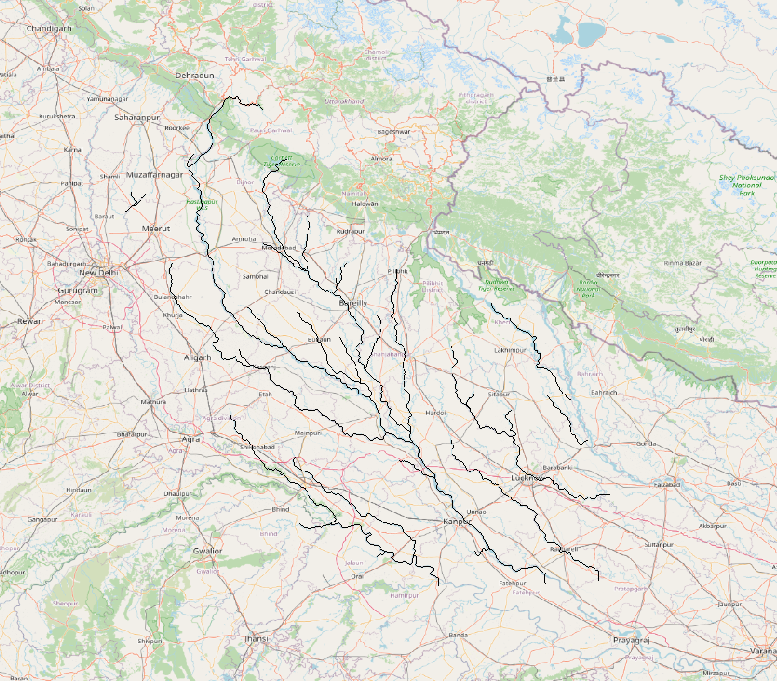

8. r.stream.extract is used to vizualize the stream flow 

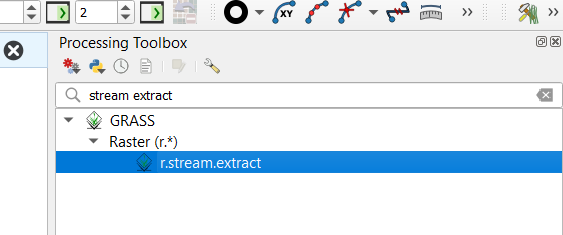

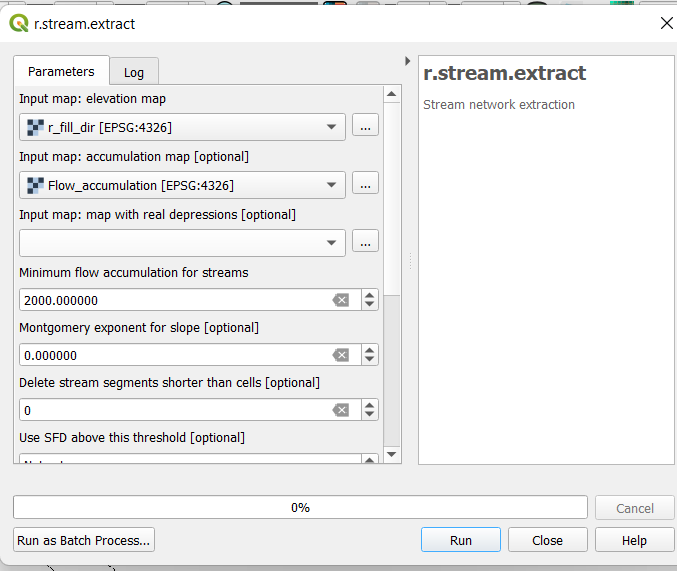

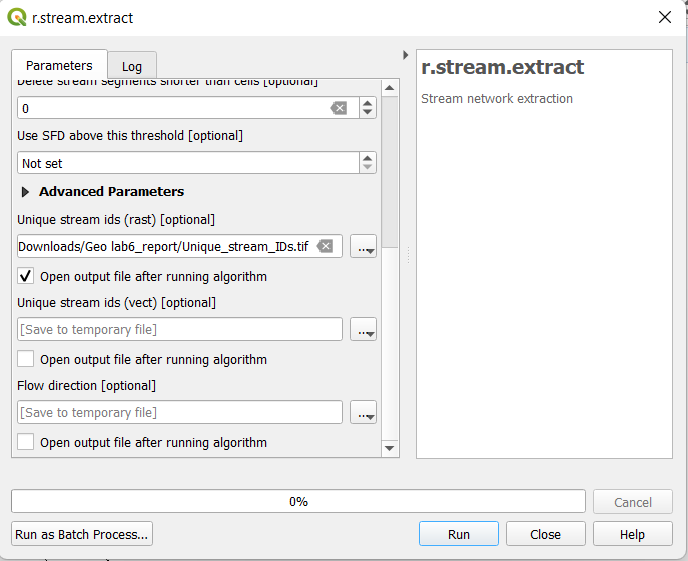

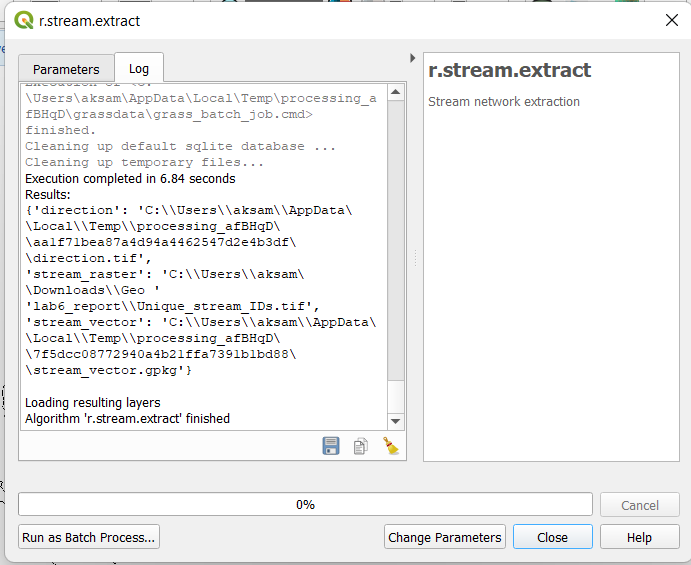

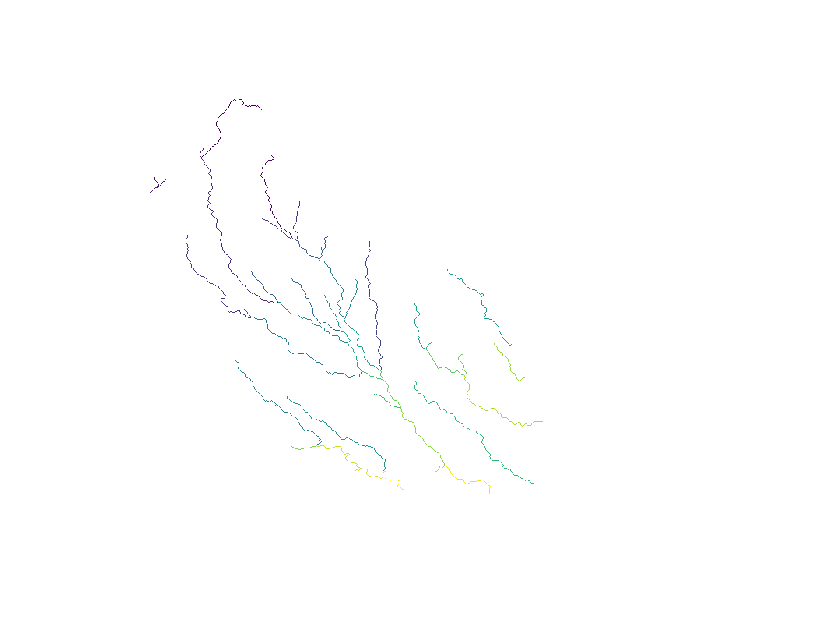

9. use r.thin and then convert raster to vector of line feature: to eliminate one place double pixle problem and make stream a line feature using r.to.vec

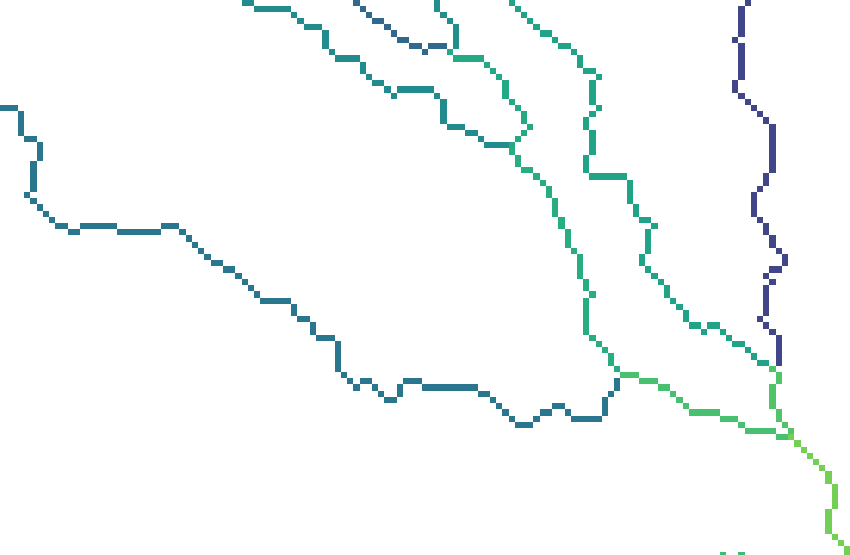

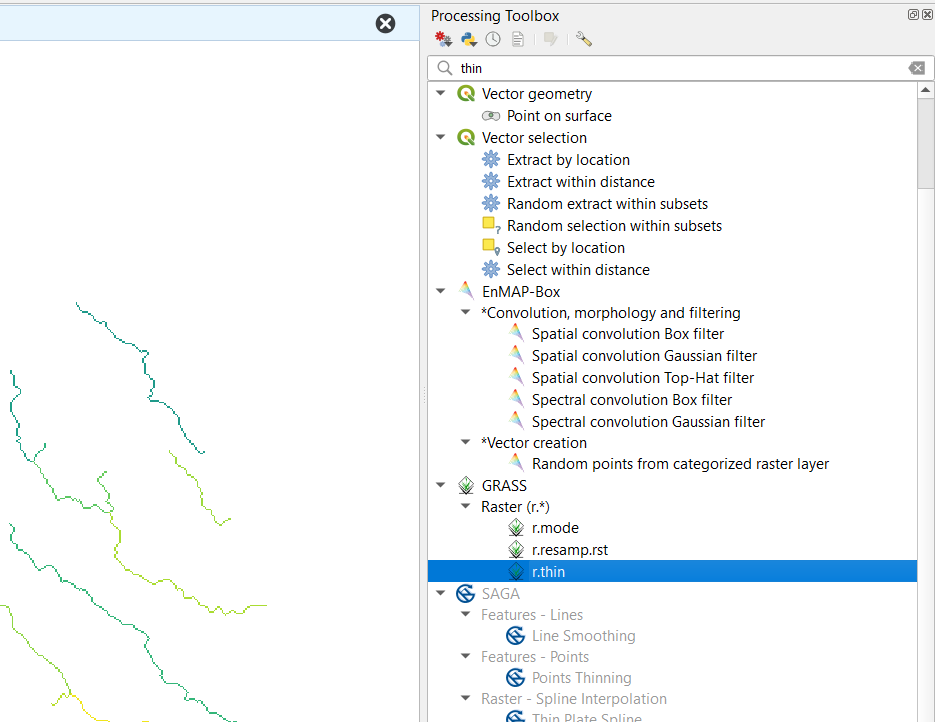

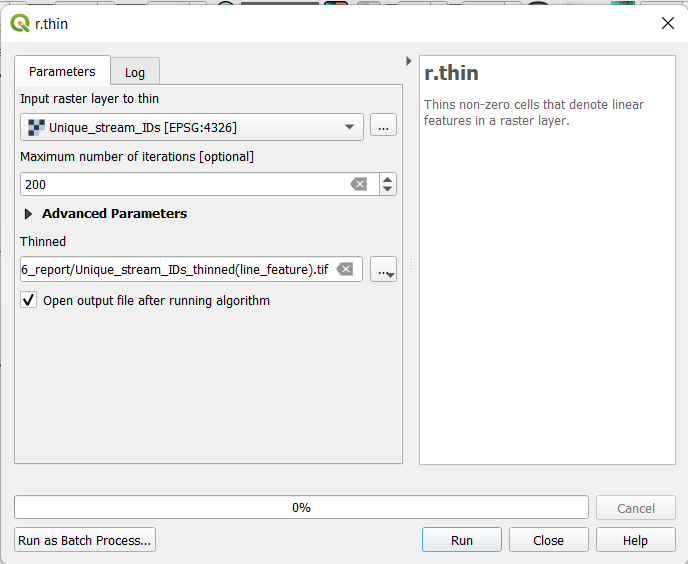

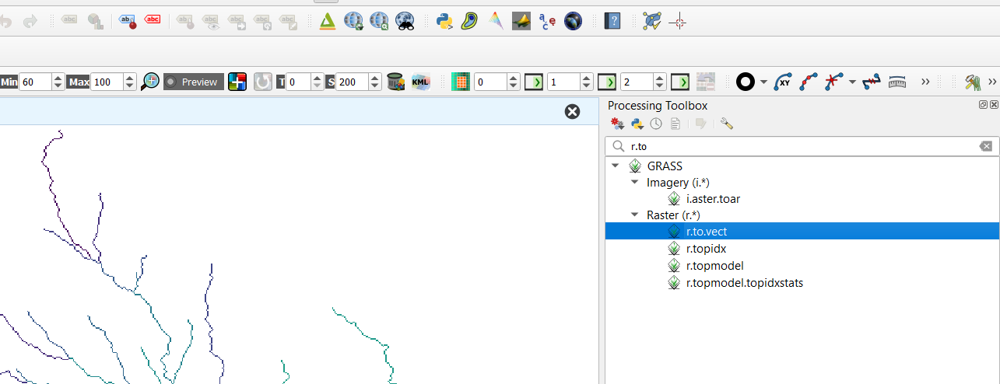

10. By using Flow Direction and r.water.outlet and given outlet cordinate in lab we create a ganga bassin

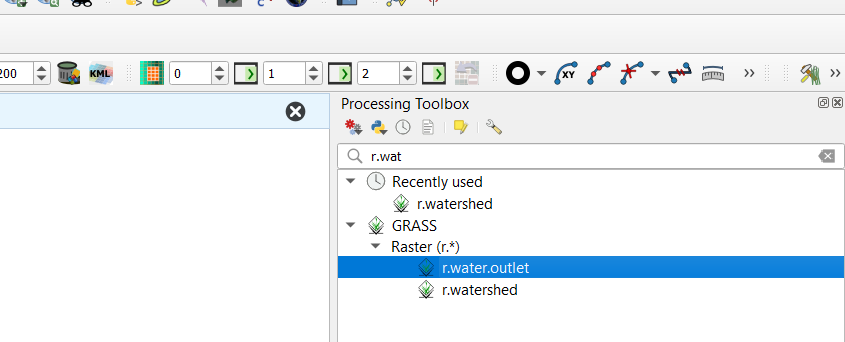

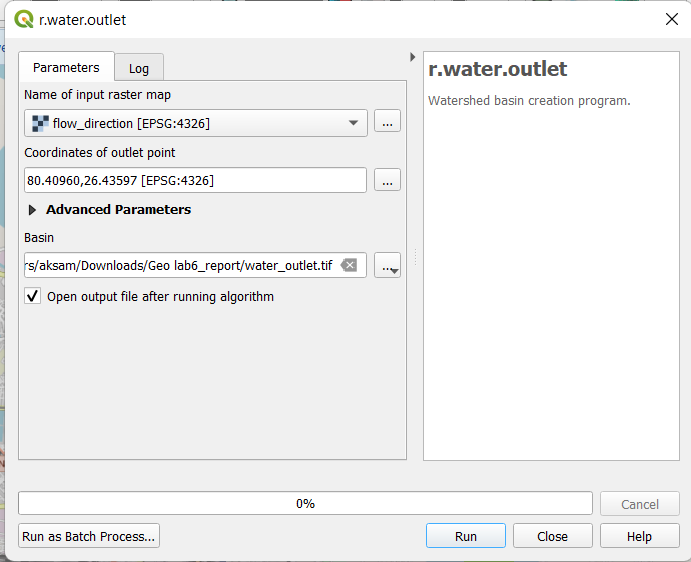

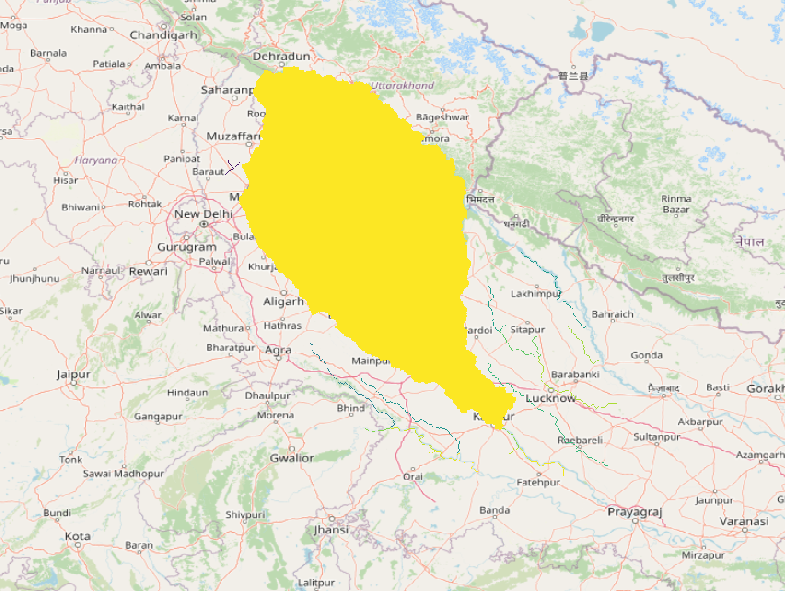

11. Creating a Point Geopackage Vector Outlet_Point

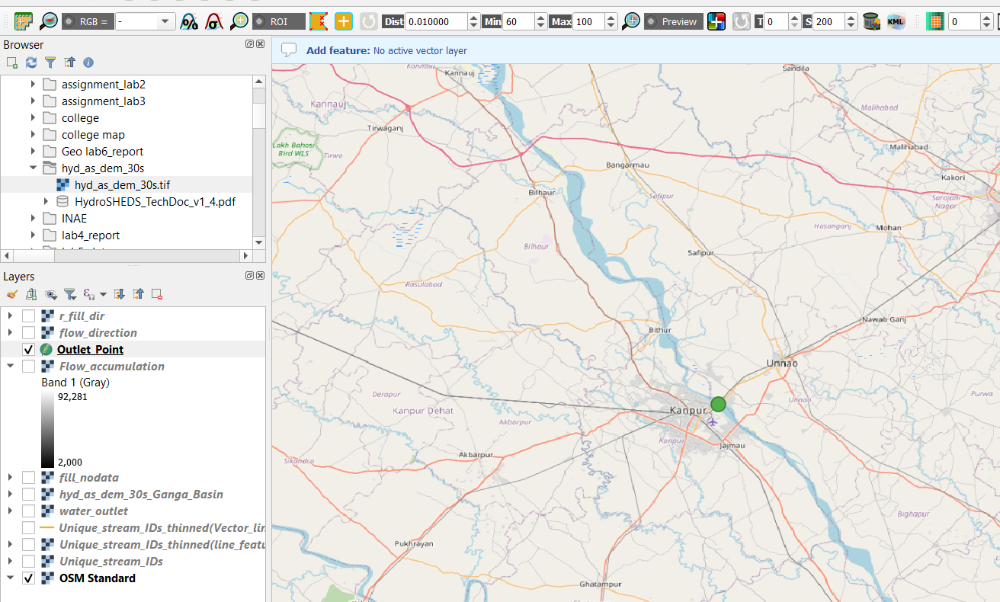

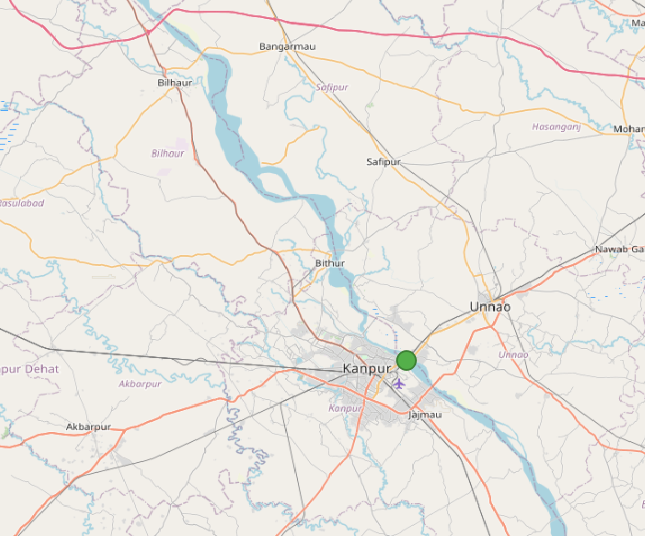

11. Convert Basin into raster to vector 

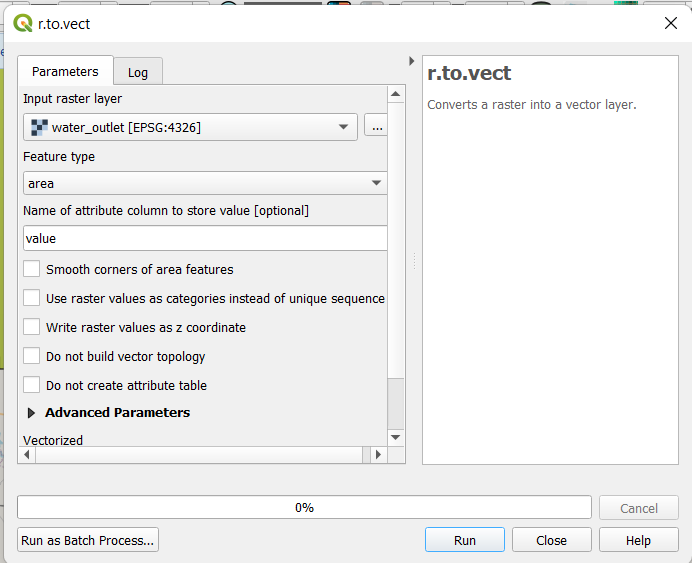

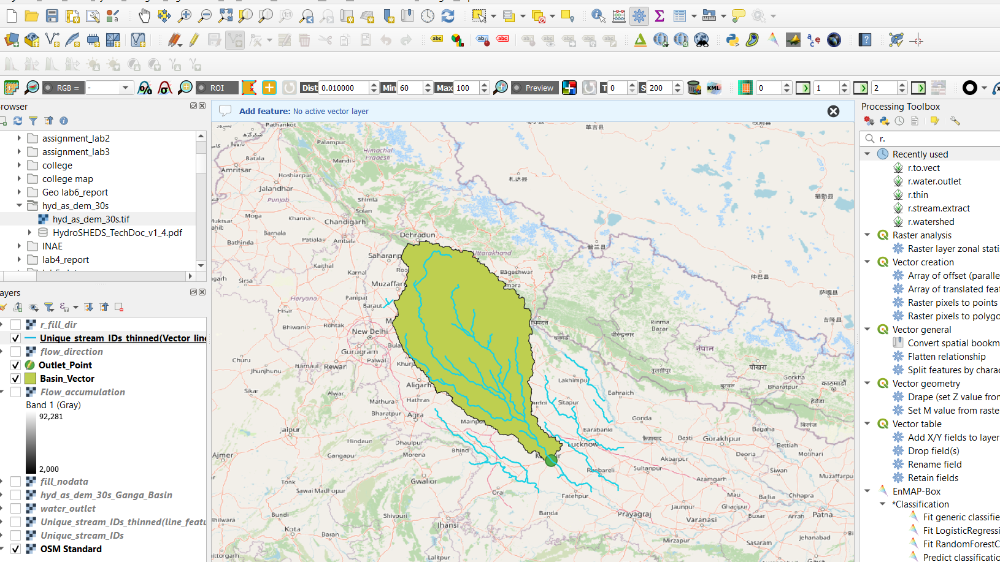

12. Clipping of Stream Vector line using Clip vector by mask layer(ganga basin vector layer)

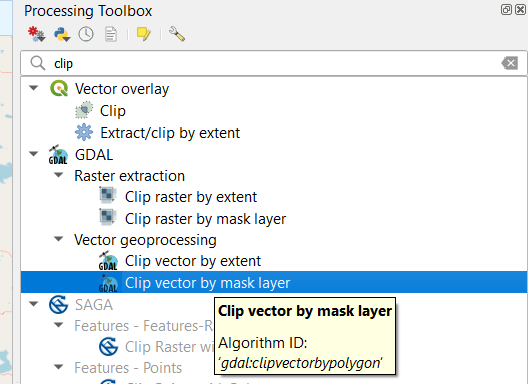

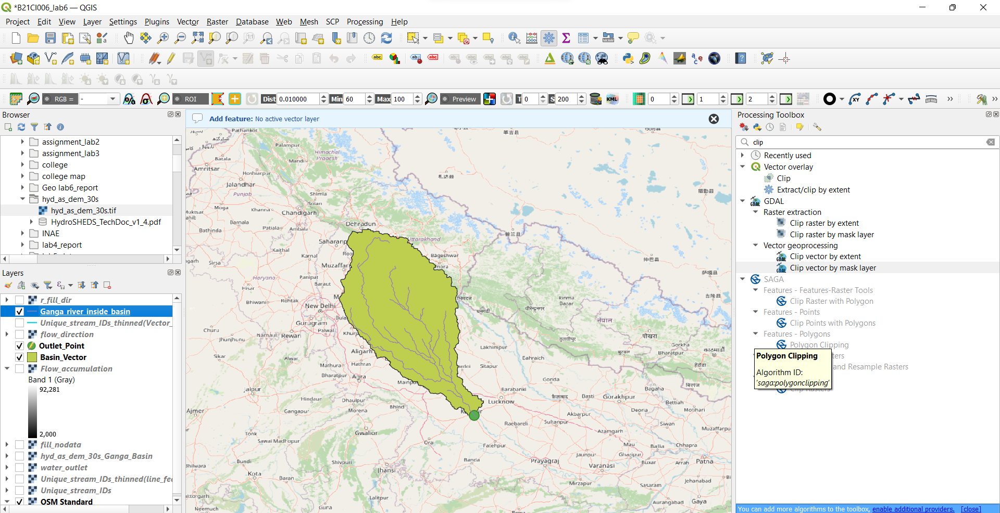

13. Contour 

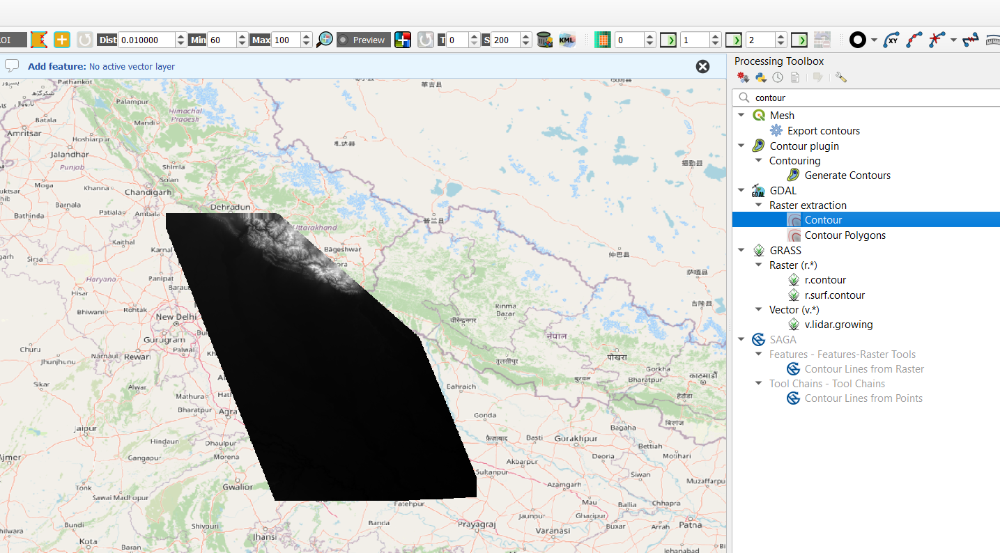

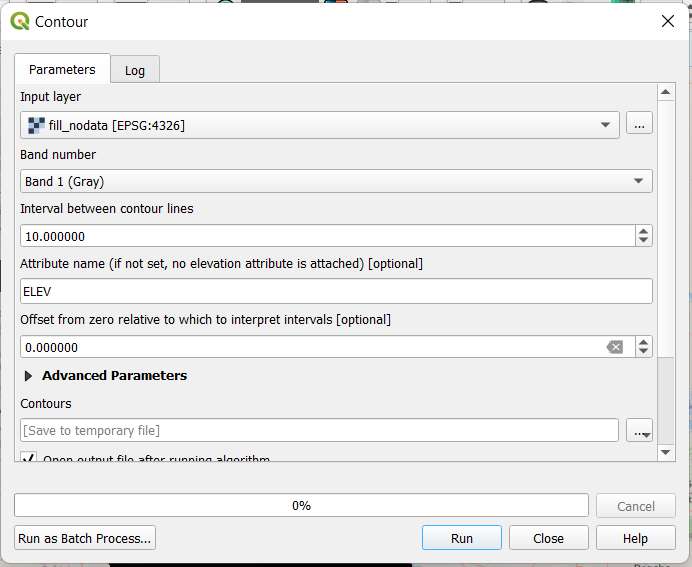

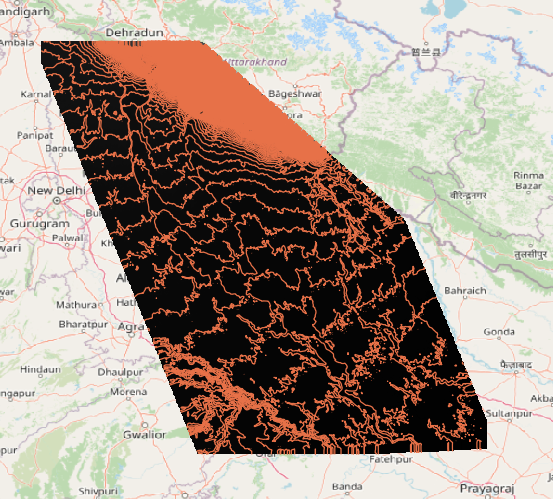

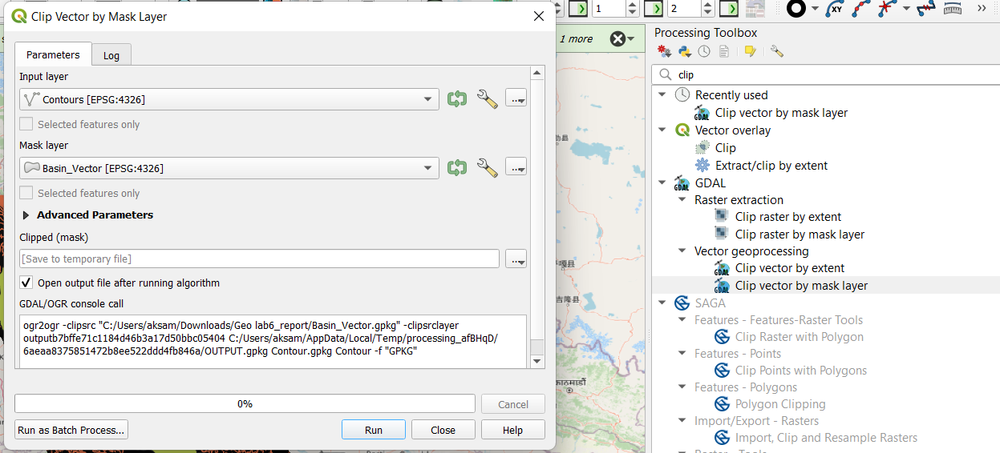

14. remove unwanted layers

15. Symbology of DEM

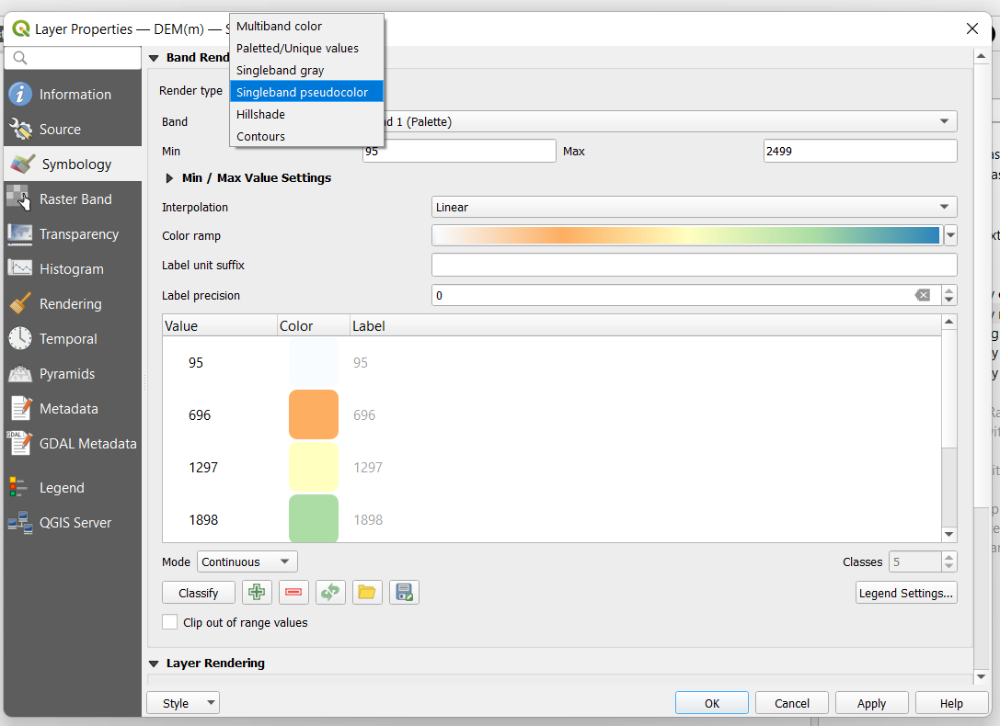

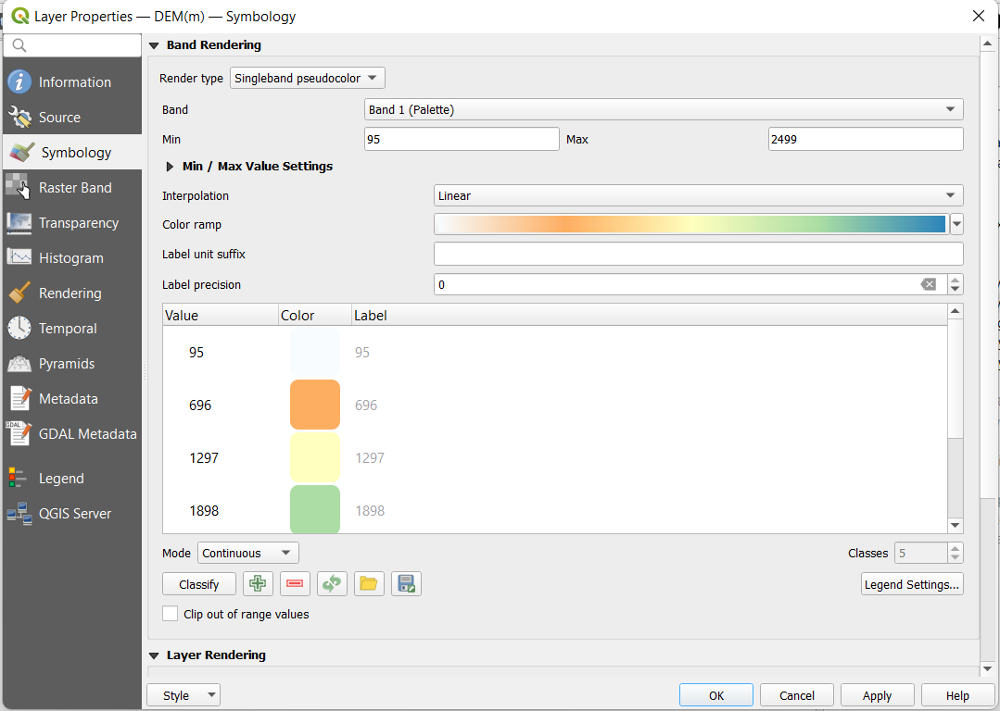

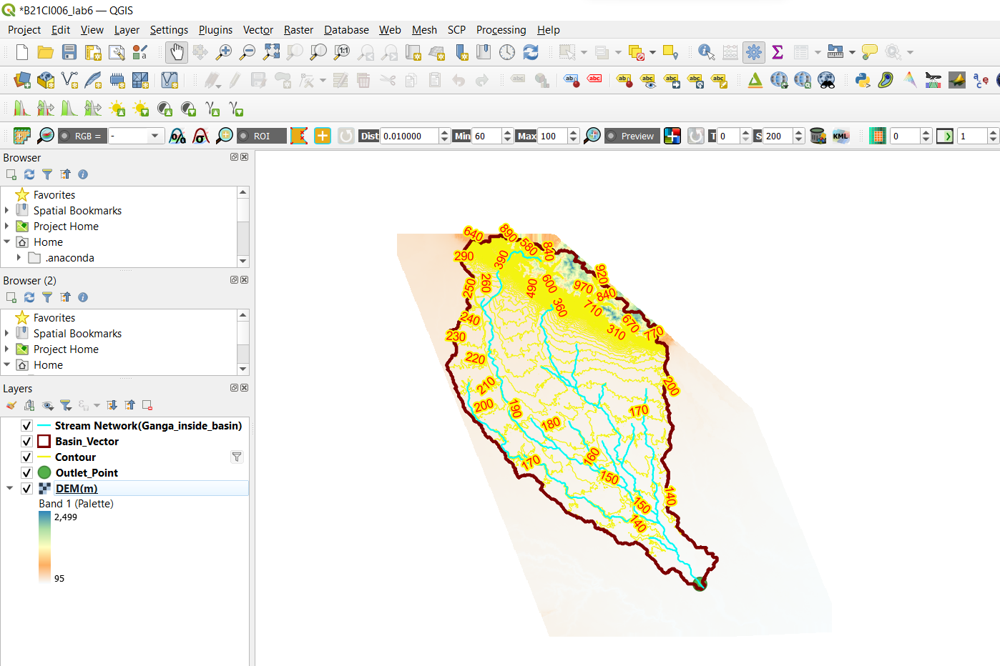


16. Mapping

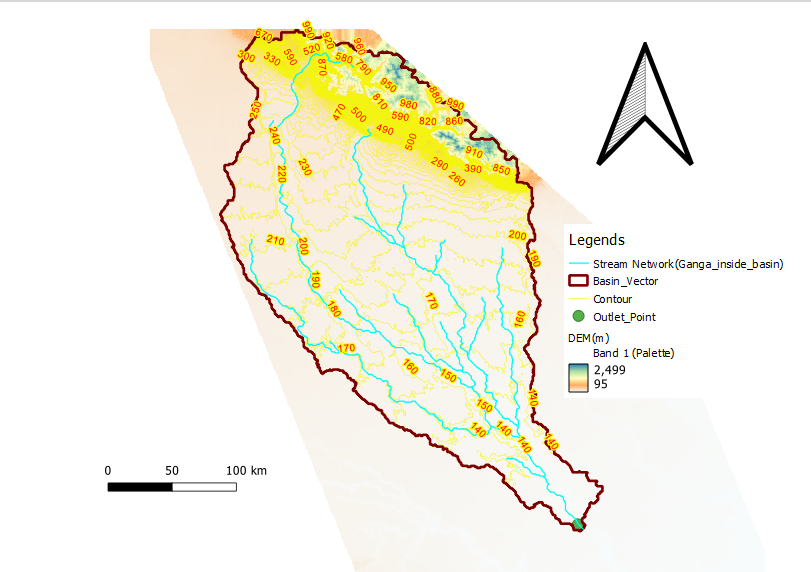

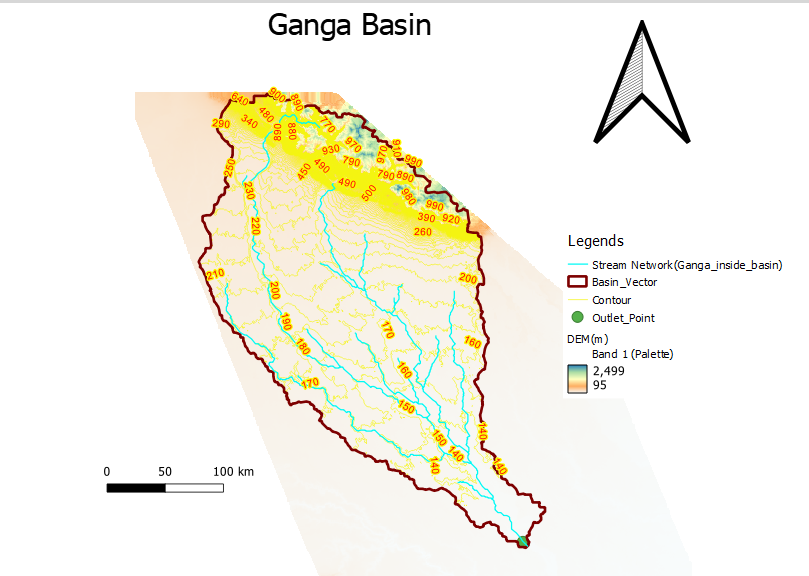


### <font color='RebeccaPurple'>1.5 Results and Discussions</font>

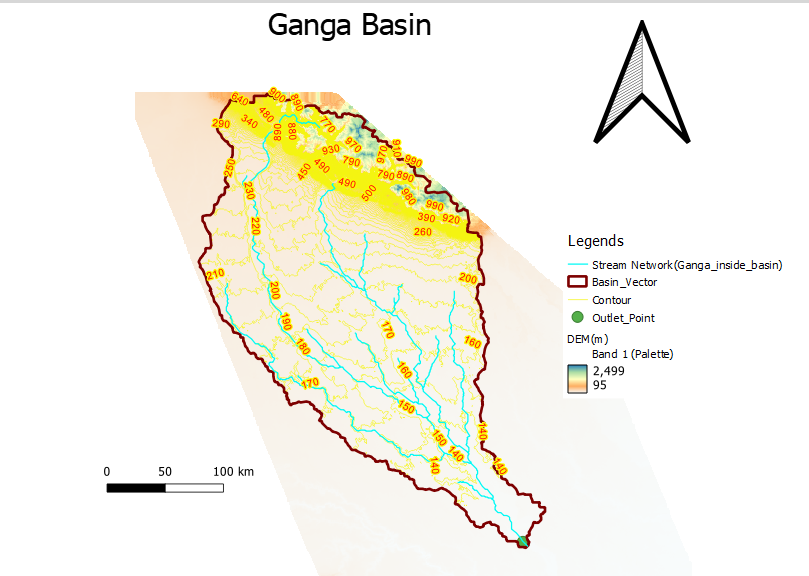

## <font color='RebeccaPurple'>Part 2: Additional Questions </font>

<font color='RebeccaPurple'>**Q2.1. What do you mean by subsetting raster? Which option in QGIS is used for subsetting raster?**</font> <mark>(<font color=red>Maximum Marks: 2</font>)</mark>

Users will often download a dataset that is larger than the area they need.  This will slow processing time and make the map look cluttered. For increase Processing we clip rater/subsetting raster by We cut the raster in needed area of raster by using a polygon vector layer. This will increase the processing.
Clip raster by mask layer is used in QGIS for subsetting raster.

<font color='RebeccaPurple'>**Q2.2. Define following terms?**</font> <mark>(<font color=red>Maximum Marks: 3</font>)</mark>

    a. Watershed
    b. Tributory
    c. Stream
    d. Distributory
    e. Pour Point
    f. Flow Accumulation

* Watershed: A watershed is the upslope area that contributes flow—generally water—to a common outlet as concentrated drainage. 
* Tributory : Stream or river that flows into a main stem river or lake. A stream that contributes water other main/larger stream. For example: Yamuna is tributary of River Ganga. 
* Stream : A flow of water in a channel or bed, as a brook, rivulet, or small river. Stream is a body of flowing water. Depending upon the amount of water being carried, stream can be small (such as creek, rivulet) or it can be large (such as river).  
* Distributory: A stream that takes water out of main stream. Usually, distributary is present near Ocean Coast. Near coast main river divided into multiple distributary streams before it falls in the Ocean. 
* Pour Point: is the point on the surface at which water flows out of an area. It is the lowest point along the boundary of a watershed.
* Flow Accumulation: Flow Accumulation is the total accumulated flow volume along the direction. 

<font color='RebeccaPurple'>**Q2.3. List different steps in watershed delineation in proper order?**</font> <mark>(<font color=red>Maximum Marks: 3</font>)</mark>

the process of watershed delineation is carried out in following steps:
1. Sub Setting the raster: There are two methods method:
   1.1:
   * 1.1.1 Create mask and 
   * 1.1.2 Cut Raster using the created mask
   1.2:
   * 1.2.1 Create virtual raster from a set of raster Mosaic
   * 1.2.2 Create mask as a polygon vector layer
   * 1.2.3 Cut Raster using the created mask
2. Filling: First Void Filling then Sink Filling
3. Flow Direction using D8 or D-infinity algorithm
4. Stream Extraction: either by Flow Accumulation threshold and Strahler Order Convert stream layer to line vector layer (if needed)
5. Mark basin outlet and snap it to river network
6. Delineate watershed with the snapped basin outlet

<font color='RebeccaPurple'>**Q2.4. What are the limitation of watershed delineation using DEM?**</font> <mark>(<font color=red>Maximum Marks: 2</font>)</mark>

limitations are:
1. This workflow do not if the region is flat as flow direction can not be calculated accurately
   in that case.
2. If the region is artificially modified (such as presence of artificial channel or canals), then
   this method will not work.
3. The quality of DEM should be good.
4. The resolution of DEM should be adequate for the given use-case. For instance, in most of cases 30m resolution DEM might be sufficient; however, if we are doing dam-related study, DEM for higher resolution (≤ 5 m) should be used.